In [1]:
# numpy and pandas for data manipulation
import numpy as np
import pandas as pd 

# File system manangement
import os

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
X_train = pd.read_csv('../data/X_train_fe.csv')
X_test = pd.read_csv('../data/X_test_fe.csv')
y_train = pd.read_csv('../data/y_train.csv')
y_test = pd.read_csv('../data/y_test.csv')

In [4]:
# Map target to numeric
y_train_numeric = y_train['Target'].map({'Low': 0, 'Medium': 1, 'High': 2})
y_test_numeric = y_test['Target'].map({'Low': 0, 'Medium': 1, 'High': 2})


# Four parts of Hyperparameter tuning

It's helpful to think of hyperparameter tuning as having four parts (these four parts also will form the basis of Bayesian Optimization):
1. Objective function: a function that takes in hyperparameters and returns a score we are trying to minimize or maximize
2. Domain: the set of hyperparameter values over which we want to search. 
3. Algorithm: method for selecting the next set of hyperparameters to evaluate in the objective function.
4. Results history: data structure containing each set of hyperparameters and the resulting score from the objective function.

Switching from grid to random search to Bayesian optimization will only require making minor modifications to these four parts.

### 1. Objective Function
The objective function takes in hyperparameters and outputs a value representing a score. Traditionally in optimization, this is a score to minimize, but here our score will be the `ROC AUC` which of course we want to maximize. Later, when we get to Bayesian Optimization, we will have to use a value to minimize, so we can take `1−ROC AUC` as the score. What occurs in the middle of the objective function will vary according to the problem, but for this problem, we will use cross validation with the specified model hyperparameters to get the cross-validation ROC AUC. This score will then be used to select the best model hyperparameter values.

In addition to returning the value to maximize, our objective function will return the hyperparameters and the iteration of the search. These results will let us go back and inspect what occurred during a search. The code below implements a simple objective function which we can use for both grid and random search.

In [ ]:
import lightgbm as lgb
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.metrics import make_scorer, log_loss, roc_auc_score
import numpy as np

# -------------------------------
# Custom scorers
# -------------------------------
# neg_log_loss scorer for sklearn
neg_log_loss_scorer = make_scorer(log_loss, greater_is_better=False, needs_proba=True)

# ROC AUC scorer (weighted for multiclass)
roc_auc_scorer = make_scorer(
    roc_auc_score,
    multi_class='ovr',
    average='weighted',
    needs_proba=True
)

# -------------------------------
# Model
# -------------------------------
model = lgb.LGBMClassifier(
    boosting_type='gbdt',
    objective='multiclass',
    num_class=3,
    n_estimators=5000,           # large to allow early stopping
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1
)

# -------------------------------
# Cross-validation with early stopping
# -------------------------------
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Fit model with early stopping on each fold manually
neg_log_losses = []
roc_aucs = []

for train_idx, val_idx in cv.split(X_train, y_train_numeric):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_numeric[train_idx], y_train_numeric[val_idx]

    model.fit(
        X_tr, y_tr,
        eval_set=[(X_val, y_val)],
        eval_metric='multi_logloss',
        callbacks=[
            lgb.early_stopping(stopping_rounds=100),
            lgb.log_evaluation(period=100)
        ],
    )
    
    proba = model.predict_proba(X_val)
    neg_log_losses.append(-log_loss(y_val, proba))  # sklearn-style neg_log_loss
    roc_aucs.append(roc_auc_score(y_val, proba, multi_class='ovr', average='weighted'))

print(f"CV neg_log_loss (mean ± std): {np.mean(neg_log_losses):.5f} ± {np.std(neg_log_losses):.5f}")
print(f"CV ROC AUC (mean ± std): {np.mean(roc_aucs):.5f} ± {np.std(roc_aucs):.5f}")

# -------------------------------
# Final model training on full dataset
# -------------------------------
final_model = lgb.LGBMClassifier(
    boosting_type='gbdt',
    objective='multiclass',
    num_class=3,
    n_estimators=model.best_iteration_,  # best from CV fold
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1
)

final_model.fit(X_train, y_train_numeric)

# -------------------------------
# Evaluation on test set
# -------------------------------
proba_test = final_model.predict_proba(X_test)
pred_test = np.argmax(proba_test, axis=1)

print("\n--- Test set performance ---")
print(f"ROC AUC (ovr weighted): {roc_auc_score(y_test_numeric, proba_test, multi_class='ovr', average='weighted'):.5f}")
print(f"Log loss: {log_loss(y_test_numeric, proba_test):.5f}")
print(f"Accuracy: {final_model.score(X_test, y_test_numeric):.5f}")


### 2. Domain

The domain, or search space, is all the possible values for all the hyperparameters that we want to search over. For random and grid search, the domain is a hyperparameter grid and usually takes the form of a dictionary with the keys being the hyperparameters and the values lists of values for each hyperparameter.


#### Hyperparameters for LightGBM

In [5]:
import lightgbm as lgb

# Create a default model
model = lgb.LGBMModel()
model.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

Some of the hyperparameters do not need to be tuned if others are: for example, `min_child_samples` and `min_child_weight` both limit the complexity of individual decision trees by adjusting the minimum leaf observation requirements and therefore we will only adjust one. However, there are still many hyperparameters to optimize, and we will choose 10 to tune.

Choosing a hyperparameter grid is probably the most difficult part of hyperparameter tuning: it's nearly impossible ahead of time to say which values of hyperparameters will work well and the optimal settings will depend on the dataset. Moreover, the hyperparameters have complex interactions with each other which means that just tuning one at a time doesn't work because when we start changing other hyperparameters that will affect the one we just tuned!


A complete grid for the 10 hyperparameter is defined below. Each of the values in the dicionary must be a list, so we use list combined with range, `np.linspace`, and `np.logspace` to define the range of values for each hyperparameter.

In [7]:
# Hyperparameter grid
param_grid = {
    'boosting_type': ['gbdt', 'dart'],
    'num_leaves': list(range(20, 150)),
    'learning_rate': list(np.logspace(np.log10(0.005), np.log10(0.5), base = 10, num = 1000)),
    'subsample_for_bin': list(range(20000, 300000, 20000)),
    'min_child_samples': list(range(20, 500, 5)),
    'reg_alpha': list(np.linspace(0, 1)),
    'reg_lambda': list(np.linspace(0, 1)),
    'colsample_bytree': list(np.linspace(0.6, 1, 10)),
    'subsample': list(np.linspace(0.5, 1, 100)),
    'is_unbalance': [True, False]
}

 For the hyperparameters that must be integers (`num_leaves`, `min_child_samples`), we use `range(start, stop, [step])` which returns a range of numbers from start to stop spaced by step (or 1 if not specified). range always returns integers, which means that if we want evenly spaced values that can be fractions, we need to use `np.linspace(start, stop, [num])`. This works the same way except the third argument is the number of values (by default 100).


 `np.logspace(start, stop, [num = 100], [base = 10.0])` returns values evenly spaced on a logarithmic scale. 

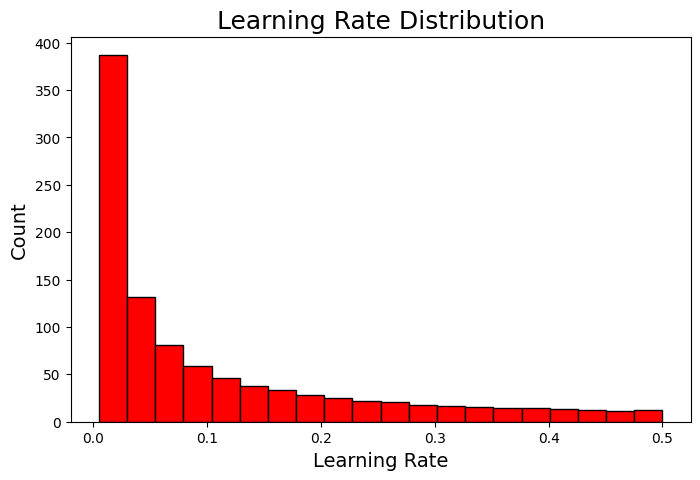

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


learning_rates = np.logspace(np.log10(0.005), np.log10(0.5), num=1000)

plt.figure(figsize=(8, 5))
plt.hist(learning_rates, bins=20, color='r', edgecolor='k')
plt.xlabel('Learning Rate', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Learning Rate Distribution', fontsize=18)
plt.show()


The learning rate domain is from 0.005 to 0.5. Using a logarithmic uniform distribution allows us to create a domain where there are as many values from 0.005 to 0.05 as from 0.05 to 0.5. In a linear space, there would be far more values from 0.05 to 0.5 because this represents a larger distance in linear space but in logarithmic space each of these two intervals is the same width because they are multiples of 10 of each other. (Think about going from 1 to 10 and then from 10 to 100. On a logarithmic scale, these intervals are the same size, but on a linear scale the latter is 10 times the size of the former). In other words, a logarithmic uniform distribution lets us sample more evenly from a domain that varies over several orders of magnitude.



As an example of a simple domain, the `num_leaves` is a uniform distribution. This means values are evenly spaced on a linear scale.


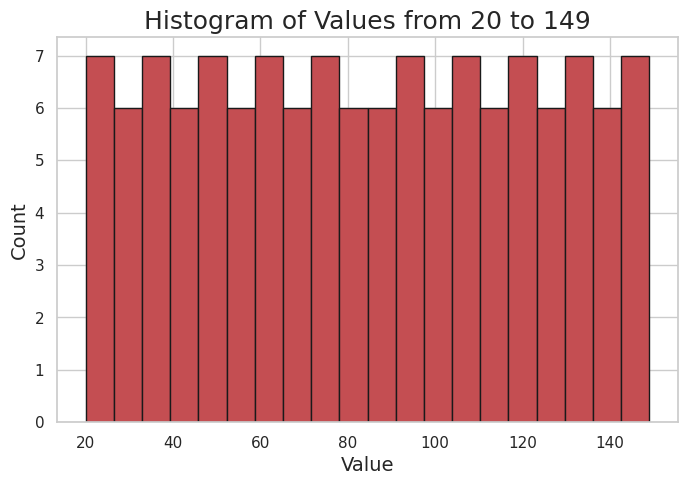

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")

values = list(range(20, 150))

plt.figure(figsize=(8, 5))
plt.hist(values, bins=20, color='r', edgecolor='k')
plt.xlabel('Value', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Histogram of Values from 20 to 149', fontsize=18)
plt.show()


### 3. Algorithm for selecting next values
In the case of grid search, we input the domain and the algorithm selects the next value for each hyperparameter in an ordered sequence. The only requirement of grid search is that it tries every combination in a grid once (and only once). For random search, we input the domain and each time the algorithm gives us a random combination of hyperparameter values to try. There are no requirements for random search other than that the next values are selected at random.

### 4. Results

The results history is a data structure that contains the hyperparameter combinations and the resulting score on the objective function. In Bayesian Optimization, the model actually uses the past results to decide on the next hyperparmeters to evaluate. Random and grid search are uninformed methods that do not use the past history, but we still need the history so we can find out which hyperparameters worked the best!

A dataframe is a useful data structure to hold the results.

In [10]:
MAX_EVALS = 5
random_results = pd.DataFrame(columns = ['score', 'params', 'iteration'],index = list(range(MAX_EVALS)))

grid_results = pd.DataFrame(columns = ['score', 'params', 'iteration'],index = list(range(MAX_EVALS)))

#### Grid Search Implementation

 The grid search method for finding the answer is to try all combinations of values in the domain and hope that the best combination is in the grid (in reality, we will never know if we found the best settings unless we have an infinite hyperparameter grid which would then require an infinite amount of time to run).

 Grid search suffers from one limiting problem: it is extremely computationally expensive because we have to perform cross validation with every single combination of hyperparameters in the grid! Let's see how many total hyperparameter settings there are in our simple little grid we developed.

In [13]:
com = 1
for x in param_grid.values():
    com *= len(x)
print('There are {} combinations'.format(com))

There are 1747200000000000 combinations


 Let's assume 100 seconds per evaluation and see how many years this would take:

In [15]:
print('This would take {:.0f} years to finish.'.format((100 * com) / (60 * 60 * 24 * 365)))

This would take 5540334855 years to finish.


In [17]:
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.metrics import make_scorer, log_loss, roc_auc_score
import numpy as np


# -------------------------------
# Custom scorers
# -------------------------------
neg_log_loss_scorer = make_scorer(log_loss, greater_is_better=False, needs_proba=True)

# ROC AUC scorer (weighted for multiclass)
roc_auc_scorer = make_scorer(
    roc_auc_score,
    multi_class='ovr',
    average='weighted',
    needs_proba=True
)

# -------------------------------
# Hyperparameter grid
# -------------------------------
param_grid = {
    'num_leaves': [31, 50],
    'max_depth': [4, 6],
    #'min_child_samples': [20, 50, 100],
    #'subsample': [0.6, 0.8, 1.0],
    #'colsample_bytree': [0.6, 0.8, 1.0],
    #'reg_alpha': [0.0, 0.1, 0.5],
    #'reg_lambda': [0.0, 0.1, 0.5]
}

model = lgb.LGBMClassifier(
    boosting_type='gbdt',
    objective='multiclass',
    num_class=3,
    n_estimators=2000,  # reasonable number for GridSearch
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)


grid_search = GridSearchCV(
    estimator=model,
    param_grid=param_grid,
    scoring=neg_log_loss_scorer,  # maximize negative log loss
    cv=cv,
    n_jobs=-1,
    verbose=2,
    refit=True
)

grid_search.fit(X_train, y_train_numeric)  # integer labels 0,1,2


print("Best params:", grid_search.best_params_)
print("Best CV neg_log_loss:", grid_search.best_score_)


# -------------------------------
# Evaluate ROC AUC with best model
# -------------------------------
best_model = grid_search.best_estimator_
proba_test = best_model.predict_proba(X_test)
pred_test = np.argmax(proba_test, axis=1)

roc_auc = roc_auc_score(y_test_numeric, proba_test, multi_class='ovr', average='weighted')
logloss = log_loss(y_test_numeric, proba_test)
accuracy = best_model.score(X_test, y_test_numeric)

print("\n--- Test set performance ---")
print(f"ROC AUC (ovr weighted): {roc_auc:.5f}")
print(f"Log loss: {logloss:.5f}")
print(f"Accuracy: {accuracy:.5f}")

Fitting 5 folds for each of 4 candidates, totalling 20 fits


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004933 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011730 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1096
[LightGBM] [Info] Total Bins 1095
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010609 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Number of data points in the train set: 6155, number of used features: 109
[LightGBM] [Info] Total Bins 1095
[LightGBM] [Info] Start training from score -0.426232
[LightGBM] [Info] Start training from score -1.210220
[LightGBM] [Info] S

#### Random Search


Random search is surprisingly efficient compared to grid search. Although grid search will find the optimal value of hyperparameters (assuming they are in your grid) eventually, random search will usually find a "close-enough" value in far fewer iterations.
This great paper explains why this is so:  https://www.jmlr.org/papers/volume13/bergstra12a/bergstra12a.pdf

grid search spends too much time evaluating unpromising regions of the hyperparameter search space because it has to evaluate every single combination in the grid. Random search in contrast, does a better job of exploring the search space and therefore can usually find a good combination of hyperparameters in far fewer iterations.


 random search should probably be the first hyperparameter optimization method tried because of its effectiveness. Even though it's an uninformed method (meaning it does not rely on past evaluation results), random search can still usually find better values than the default and is simple to run.

In [18]:
import lightgbm as lgb
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import make_scorer, log_loss, roc_auc_score
from scipy.stats import randint, uniform
import numpy as np

# -------------------------------
# Custom scorers
# -------------------------------
neg_log_loss_scorer = make_scorer(log_loss, greater_is_better=False, needs_proba=True)

roc_auc_scorer = make_scorer(
    roc_auc_score,
    multi_class='ovr',
    average='weighted',
    needs_proba=True
)

# -------------------------------
# Hyperparameter distributions
# -------------------------------
param_dist = {
    #'num_leaves': randint(31, 128),
    'max_depth': randint(4, 12),
    #'min_child_samples': randint(10, 100),
    #'subsample': uniform(0.6, 0.4),
    #'colsample_bytree': uniform(0.6, 0.4),
    #'reg_alpha': uniform(0.0, 0.5),
    #'reg_lambda': uniform(0.0, 0.5)
}

# -------------------------------
# Base model
# -------------------------------
model = lgb.LGBMClassifier(
    boosting_type='gbdt',
    objective='multiclass',
    num_class=3,
    n_estimators=5000,  # high for early stopping
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1
)

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# -------------------------------
# RandomizedSearchCV
# -------------------------------
random_search = RandomizedSearchCV(
    estimator=model,
    param_distributions=param_dist,
    n_iter=20,
    scoring=neg_log_loss_scorer,
    cv=cv,
    n_jobs=-1,
    verbose=2,
    refit=True,
    random_state=42
)

# -------------------------------
# Fit with early stopping per fold
# -------------------------------
# RandomizedSearchCV does not natively support early stopping, so we manually fit each fold
neg_log_losses = []
roc_aucs = []

for train_idx, val_idx in cv.split(X_train, y_train_numeric):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train_numeric[train_idx], y_train_numeric[val_idx]

    random_search.fit(
        X_tr, y_tr,
        eval_set=[(X_val, y_val)],
        eval_metric='multi_logloss',
        callbacks=[
            lgb.early_stopping(stopping_rounds=100),
            lgb.log_evaluation(period=100)
        ]
    )

    best_model = random_search.best_estimator_
    proba_val = best_model.predict_proba(X_val)

    neg_log_losses.append(-log_loss(y_val, proba_val))
    roc_aucs.append(roc_auc_score(y_val, proba_val, multi_class='ovr', average='weighted'))

print(f"CV neg_log_loss (mean ± std): {np.mean(neg_log_losses):.5f} ± {np.std(neg_log_losses):.5f}")
print(f"CV ROC AUC (mean ± std): {np.mean(roc_aucs):.5f} ± {np.std(roc_aucs):.5f}")

# -------------------------------
# Final model on full training data
# -------------------------------
final_model = lgb.LGBMClassifier(
    **random_search.best_params_,
    boosting_type='gbdt',
    objective='multiclass',
    num_class=3,
    n_estimators=random_search.best_estimator_.best_iteration_,
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1
)

final_model.fit(X_train, y_train_numeric)

# -------------------------------
# Evaluate on test set
# -------------------------------
proba_test = final_model.predict_proba(X_test)
pred_test = np.argmax(proba_test, axis=1)

roc_auc = roc_auc_score(y_test_numeric, proba_test, multi_class='ovr', average='weighted')
logloss = log_loss(y_test_numeric, proba_test)
accuracy = final_model.score(X_test, y_test_numeric)

print("\n--- Test set performance ---")
print(f"ROC AUC (ovr weighted): {roc_auc:.5f}")
print(f"Log loss: {logloss:.5f}")
print(f"Accuracy: {accuracy:.5f}")


Fitting 5 folds for each of 20 candidates, totalling 100 fits
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.005620 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1088
[LightGBM] [Info] Number of data points in the train set: 4924, number of used features: 108
[LightGBM] [Info] Start training from score -0.426294
[LightGBM] [Info] Start training from score -1.210220
[LightGBM] [Info] Start training from score -3.017080
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.030835 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1086
[LightGBM] [Info] Number of data points in the train set: 4924, number of used features: 109
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead

Exception ignored on calling ctypes callback function: <function _log_callback at 0x7ff507a3a680>
Traceback (most recent call last):
  File "/home/ismail/miniconda/envs/ml-dl/lib/python3.10/site-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
KeyboardInterrupt: 
Exception ignored on calling ctypes callback function: <function _log_callback at 0x7f9643b4a680>
Traceback (most recent call last):
  File "/home/ismail/miniconda/envs/ml-dl/lib/python3.10/site-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
KeyboardInterrupt: 
Exception ignored on calling ctypes callback function: <function _log_callback at 0x7f3bc22f2680>
Traceback (most recent call last):
  File "/home/ismail/miniconda/envs/ml-dl/lib/python3.10/site-packages/lightgbm/basic.py", line 287, in _log_callback
    def _log_callback(msg: bytes) -> None:
KeyboardInterrupt: 
Exception ignored on calling ctypes callback function: <fu

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.013960 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1084
[LightGBM] [Info] Number of data points in the train set: 4924, number of used features: 109
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014157 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1085
[LightGBM] [Info] Start training from score -0.425983
[LightGBM] [Info] Number of data points in the train set: 4924, number of used features: 109
[LightGBM] [Info] Start training from score -1.210220
[LightGBM] [Info] Start training from score -3.021238
[LightGBM] [Info] Start training from score -0

KeyboardInterrupt: 

## Stacking Random and Grid Search

One option for a smarter implementation of hyperparameter tuning is to combine random search and grid search:

1. Use random search with a large hyperparameter grid
2. Use the results of random search to build a focused hyperparameter grid around the best performing hyperparameter values.
3. Run grid search on the reduced hyperparameter grid.
4. Repeat grid search on more focused grids until maximum computational/time budget is exceeded.


# Optuna

In [ ]:
import lightgbm as lgb
import optuna
from optuna.integration import LightGBMPruningCallback
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss, roc_auc_score
import numpy as np
import time

# -------------------------------
# Data: X_train, y_train, X_test, y_test
# y_train, y_test should be integers 0,1,2...
num_classes = len(np.unique(y_train_numeric))

# -------------------------------
# Optuna objective function
# -------------------------------
def objective(trial):
    param = {
        'objective': 'multiclass',
        'num_class': num_classes,
        'boosting_type': 'gbdt',
        'metric': 'multi_logloss',
        'verbosity': -1,
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.15),
        'num_leaves': trial.suggest_int('num_leaves', 31, 256),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 0.5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 0.5)
    }

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    logloss_scores = []
    
    for train_idx, valid_idx in skf.split(X_train, y_train_numeric):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[valid_idx]
        y_tr, y_val = y_train_numeric.iloc[train_idx], y_train_.iloc[valid_idx]  # <-- use .iloc

        lgb_train = lgb.Dataset(X_tr, label=y_tr)
        lgb_valid = lgb.Dataset(X_val, label=y_val)
        
        gbm = lgb.train(
            params=param,                     # better to use 'params=' explicitly
            train_set=lgb_train,
            num_boost_round=5000,
            valid_sets=[lgb_valid],
            callbacks=[
                LightGBMPruningCallback(trial, metric="multi_logloss"),
                lgb.early_stopping(stopping_rounds=100, verbose=False),
                lgb.log_evaluation(period=0)  # disables verbose output; set >0 if you want logs
            ]
        )
        
        pred_val = gbm.predict(X_val, num_iteration=gbm.best_iteration)
        logloss_scores.append(log_loss(y_val, pred_val))
    
    return np.mean(logloss_scores)

# -------------------------------
# Run Optuna
# -------------------------------
study = optuna.create_study(direction='minimize')
start = time.time()
study.optimize(objective, n_trials=30, n_jobs=1)
end = time.time()

print(f"Finished in {end-start:.2f} sec")
print("Best params:", study.best_params)
print("Best CV neg_log_loss:", study.best_value)

# -------------------------------
# Train final model with best params
# -------------------------------
best_params = study.best_params
best_params.update({
    'objective': 'multiclass',
    'num_class': num_classes,
    'metric': 'multi_logloss',
    'verbosity': -1
})

lgb_train_full = lgb.Dataset(X_train, label=y_train_numeric)
lgb_test_full = lgb.Dataset(X_test, label=y_test_numeric)



final_model = lgb.train(
    params=best_params,              # better style: use named argument
    train_set=lgb_train_full,
    num_boost_round=5000,
    valid_sets=[lgb_test_full],
    callbacks=[
        lgb.early_stopping(stopping_rounds=100, verbose=True),
        lgb.log_evaluation(period=100)   # prints every 100 iterations
    ]
)

# -------------------------------
# Evaluate on test set
# -------------------------------
pred_test = final_model.predict(X_test, num_iteration=final_model.best_iteration)
roc_auc = roc_auc_score(y_test_numeric, pred_test, multi_class='ovr', average='weighted')
logloss = log_loss(y_test_numeric, pred_test)
accuracy = np.mean(np.argmax(pred_test, axis=1) == y_test_numeric)

print("\n--- Test set performance ---")
print(f"ROC AUC (ovr weighted): {roc_auc:.5f}")
print(f"Log loss: {logloss:.5f}")
print(f"Accuracy: {accuracy:.5f}")

[I 2025-12-27 23:14:36,746] A new study created in memory with name: no-name-242d8062-fed1-455b-a944-9ce9e384e9c8
[I 2025-12-27 23:14:56,241] Trial 0 finished with value: 0.3094671459473747 and parameters: {'learning_rate': 0.08739954975789226, 'num_leaves': 213, 'max_depth': 5, 'min_child_samples': 26, 'subsample': 0.9614326471498583, 'colsample_bytree': 0.7909719042129465, 'reg_alpha': 0.3028364104350537, 'reg_lambda': 0.16863960149345086}. Best is trial 0 with value: 0.3094671459473747.
[I 2025-12-27 23:15:15,064] Trial 1 finished with value: 0.3094762700665856 and parameters: {'learning_rate': 0.04698840554574139, 'num_leaves': 148, 'max_depth': 4, 'min_child_samples': 22, 'subsample': 0.9062763227051994, 'colsample_bytree': 0.916818545788671, 'reg_alpha': 0.26460692654758244, 'reg_lambda': 0.30865899756607523}. Best is trial 0 with value: 0.3094671459473747.
[I 2025-12-27 23:16:00,104] Trial 2 finished with value: 0.3144659289058834 and parameters: {'learning_rate': 0.018479790918

Finished in 260.66 sec
Best params: {'learning_rate': 0.08739954975789226, 'num_leaves': 213, 'max_depth': 5, 'min_child_samples': 26, 'subsample': 0.9614326471498583, 'colsample_bytree': 0.7909719042129465, 'reg_alpha': 0.3028364104350537, 'reg_lambda': 0.16863960149345086}
Best CV neg_log_loss: 0.3094671459473747


TypeError: train() got an unexpected keyword argument 'early_stopping_rounds'

Training until validation scores don't improve for 100 rounds
[100]	valid_0's multi_logloss: 0.309773
[200]	valid_0's multi_logloss: 0.314489
Early stopping, best iteration is:
[112]	valid_0's multi_logloss: 0.309282

--- Test set performance ---
ROC AUC (ovr weighted): 0.94268
Log loss: 0.30928
Accuracy: 0.88098


In [21]:
import lightgbm as lgb
import optuna
from optuna.integration import LightGBMPruningCallback
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import log_loss, roc_auc_score
import numpy as np
import time
import gc

# -------------------------------
# Data: X_train, y_train_numeric, X_test, y_test_numeric
# Assume they are already prepared as pandas DataFrame/Series or numpy arrays
# y_train_numeric and y_test_numeric should be integer labels: 0, 1, 2, ...
# -------------------------------
num_classes = len(np.unique(y_train_numeric))
print(f"Number of classes: {num_classes}")

# -------------------------------
# Optuna objective function
# -------------------------------
def objective(trial):
    param = {
        'objective': 'multiclass',
        'num_class': num_classes,
        'boosting_type': 'gbdt',
        'metric': 'multi_logloss',
        'verbosity': -1,
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.15),
        'num_leaves': trial.suggest_int('num_leaves', 31, 256),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 0.5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 0.5),
    }

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    logloss_scores = []

    for train_idx, valid_idx in skf.split(X_train, y_train_numeric):
        X_tr = X_train.iloc[train_idx]
        X_val = X_train.iloc[valid_idx]
        y_tr = y_train_numeric.iloc[train_idx]
        y_val = y_train_numeric.iloc[valid_idx]

        lgb_train = lgb.Dataset(X_tr, label=y_tr)
        lgb_valid = lgb.Dataset(X_val, label=y_val, reference=lgb_train)

        gbm = lgb.train(
            params=param,
            train_set=lgb_train,
            num_boost_round=5000,
            valid_sets=[lgb_valid],
            callbacks=[
                LightGBMPruningCallback(trial, metric="multi_logloss"),  # Prune bad trials early
                lgb.early_stopping(stopping_rounds=100, verbose=False),
                lgb.log_evaluation(period=0)  # Silent during CV
            ]
        )

        pred_val = gbm.predict(X_val, num_iteration=gbm.best_iteration)
        fold_logloss = log_loss(y_val, pred_val)
        logloss_scores.append(fold_logloss)

        # Optional: early trial pruning based on intermediate folds
        trial.report(fold_logloss, step=len(logloss_scores))
        if trial.should_prune():
            raise optuna.TrialPruned()

    return np.mean(logloss_scores)


# -------------------------------
# Run Optuna
# -------------------------------
study = optuna.create_study(direction='minimize', pruner=optuna.pruners.MedianPruner())
start = time.time()
study.optimize(objective, n_trials=30, n_jobs=1)  # n_jobs=1 recommended with pruning
end = time.time()

print(f"Optuna finished in {end - start:.2f} seconds")
print("Best params:", study.best_params)
print("Best CV multi_logloss:", study.best_value)


# -------------------------------
# Train final model with best params
# -------------------------------
best_params = study.best_params
best_params.update({
    'objective': 'multiclass',
    'num_class': num_classes,
    'metric': 'multi_logloss',
    'verbosity': -1
})

lgb_train_full = lgb.Dataset(X_train, label=y_train_numeric)
lgb_test_full = lgb.Dataset(X_test, label=y_test_numeric)

print("\nTraining final model on full training data...")
final_model = lgb.train(
    params=best_params,
    train_set=lgb_train_full,
    num_boost_round=5000,
    valid_sets=[lgb_test_full],
    callbacks=[
        lgb.early_stopping(stopping_rounds=100, verbose=True),
        lgb.log_evaluation(period=100)  # Print every 100 iterations
    ]
)


# -------------------------------
# Evaluate on test set
# -------------------------------
pred_test = final_model.predict(X_test, num_iteration=final_model.best_iteration)

# Ensure labels are 1D numpy arrays
y_test_arr = np.array(y_test_numeric).flatten()

roc_auc = roc_auc_score(y_test_arr, pred_test, multi_class='ovr', average='weighted')
logloss = log_loss(y_test_arr, pred_test)
accuracy = np.mean(np.argmax(pred_test, axis=1) == y_test_arr)

print("\n--- Test set performance ---")
print(f"ROC AUC (OVR weighted): {roc_auc:.5f}")
print(f"Log Loss:           {logloss:.5f}")
print(f"Accuracy:           {accuracy:.5f}")

gc.collect()

[I 2025-12-27 23:29:33,317] A new study created in memory with name: no-name-e78c7673-cff9-4159-a72a-d5aa09e83722


Number of classes: 3


[I 2025-12-27 23:29:56,844] Trial 0 finished with value: 0.3180097104906751 and parameters: {'learning_rate': 0.10582345111345118, 'num_leaves': 164, 'max_depth': 10, 'min_child_samples': 98, 'subsample': 0.6310601432269323, 'colsample_bytree': 0.7470669352588196, 'reg_alpha': 0.4076382399226109, 'reg_lambda': 0.4314819441006071}. Best is trial 0 with value: 0.3180097104906751.
[I 2025-12-27 23:30:10,687] Trial 1 finished with value: 0.3198386921647434 and parameters: {'learning_rate': 0.14768617658210276, 'num_leaves': 254, 'max_depth': 7, 'min_child_samples': 81, 'subsample': 0.6800405272832706, 'colsample_bytree': 0.7879990535308373, 'reg_alpha': 0.09159881523947294, 'reg_lambda': 0.029516806093769166}. Best is trial 0 with value: 0.3180097104906751.
[I 2025-12-27 23:30:40,565] Trial 2 finished with value: 0.3164594518621535 and parameters: {'learning_rate': 0.04784610773515308, 'num_leaves': 33, 'max_depth': 10, 'min_child_samples': 68, 'subsample': 0.9937189259566367, 'colsample_b

Optuna finished in 436.56 seconds
Best params: {'learning_rate': 0.1394147895986289, 'num_leaves': 231, 'max_depth': 5, 'min_child_samples': 15, 'subsample': 0.6933083139250353, 'colsample_bytree': 0.6435714555116572, 'reg_alpha': 0.47801949694686735, 'reg_lambda': 0.4463636397411271}
Best CV multi_logloss: 0.31049635137090925

Training final model on full training data...
Training until validation scores don't improve for 100 rounds
[100]	valid_0's multi_logloss: 0.312924
Early stopping, best iteration is:
[76]	valid_0's multi_logloss: 0.310398

--- Test set performance ---
ROC AUC (OVR weighted): 0.94260
Log Loss:           0.31040
Accuracy:           0.87578


5251

In [24]:
# -------------------------------
# === CHECK STUDY HISTORY & BEST HYPERPARAMETERS ===
# -------------------------------
print(f"\nBest trial (lowest CV multi_logloss):")
best_trial = study.best_trial
print(f"  Trial number: {best_trial.number}")
print(f"  CV multi_logloss: {best_trial.value:.5f}")
print(f"  Best hyperparameters:")
for key, value in best_trial.params.items():
    print(f"    {key}: {value}")

# Optional: Show top 5 trials
print(f"\nTop 5 trials:")
top_trials = sorted(study.trials, key=lambda t: t.value if t.value is not None else float('inf'))[:5]
for i, trial in enumerate(top_trials):
    print(f"  #{i+1} - Trial {trial.number} | CV logloss: {trial.value:.5f} | Params: {trial.params}")

# -------------------------------
# Full study history as DataFrame (fixed for Optuna ≥ 3.0)
# -------------------------------
import pandas as pd

def get_trials_df(study):
    df = study.trials_dataframe()
    # Filter only completed trials
    df = df[df["state"] == "COMPLETE"]
    # Sort by performance (value = multi_logloss)
    df = df.sort_values("value", ascending=True).reset_index(drop=True)
    
    # Select useful columns (avoid 'params' column)
    cols = ["number", "value", "datetime_start", "datetime_complete", "duration"]
    # Add all hyperparameter columns (they are named params_xxx)
    param_cols = [col for col in df.columns if col.startswith("params_")]
    cols.extend(param_cols)
    
    df = df[cols]
    
    # Optional: rename params columns for cleaner look
    df = df.rename(columns=lambda x: x.replace("params_", "") if x.startswith("params_") else x)
    
    return df

print(f"\nFull study history (completed trials only):")
history_df = get_trials_df(study)
display(history_df)  # Nice table in Jupyter/Colab

# Or print to console
# print(history_df.to_string(index=False))

# Optional: save to CSV
history_df.to_csv("optuna_study_history.csv", index=False)


Best trial (lowest CV multi_logloss):
  Trial number: 3
  CV multi_logloss: 0.31050
  Best hyperparameters:
    learning_rate: 0.1394147895986289
    num_leaves: 231
    max_depth: 5
    min_child_samples: 15
    subsample: 0.6933083139250353
    colsample_bytree: 0.6435714555116572
    reg_alpha: 0.47801949694686735
    reg_lambda: 0.4463636397411271

Top 5 trials:
  #1 - Trial 3 | CV logloss: 0.31050 | Params: {'learning_rate': 0.1394147895986289, 'num_leaves': 231, 'max_depth': 5, 'min_child_samples': 15, 'subsample': 0.6933083139250353, 'colsample_bytree': 0.6435714555116572, 'reg_alpha': 0.47801949694686735, 'reg_lambda': 0.4463636397411271}
  #2 - Trial 23 | CV logloss: 0.31192 | Params: {'learning_rate': 0.13172930157207097, 'num_leaves': 63, 'max_depth': 7, 'min_child_samples': 32, 'subsample': 0.6414785178266659, 'colsample_bytree': 0.8660666303765505, 'reg_alpha': 0.09474239388593456, 'reg_lambda': 0.34166017664911136}
  #3 - Trial 26 | CV logloss: 0.31196 | Params: {'learni

,number,value,datetime_start,datetime_complete,duration,colsample_bytree,learning_rate,max_depth,min_child_samples,num_leaves,reg_alpha,reg_lambda,subsample
0,3,0.310496,2025-12-27 23:30:40.566585,2025-12-27 23:30:55.711154,0 days 00:00:15.144569,0.643571,0.139415,5,15,231,0.478019,0.446364,0.693308
1,23,0.311917,2025-12-27 23:36:02.049764,2025-12-27 23:36:23.221973,0 days 00:00:21.172209,0.866067,0.131729,7,32,63,0.094742,0.341660,0.641479
2,26,0.311956,2025-12-27 23:36:24.038113,2025-12-27 23:36:49.458127,0 days 00:00:25.420014,0.925781,0.135080,7,34,57,0.447781,0.270284,0.838959
3,22,0.312136,2025-12-27 23:35:35.086927,2025-12-27 23:36:02.048663,0 days 00:00:26.961736,0.865464,0.133782,7,34,147,0.188590,0.339610,0.699835
4,21,0.312164,2025-12-27 23:35:07.584487,2025-12-27 23:35:35.085594,0 days 00:00:27.501107,0.832161,0.135680,7,32,104,0.166898,0.365021,0.643046
5,17,0.312455,2025-12-27 23:34:47.785153,2025-12-27 23:35:07.264417,0 days 00:00:19.479264,0.800718,0.148421,6,43,134,0.201288,0.294165,0.728096
6,7,0.315726,2025-12-27 23:31:35.417771,2025-12-27 23:32:06.949935,0 days 00:00:31.532164,0.825334,0.141006,11,22,103,0.135666,0.387897,0.651108
7,12,0.316206,2025-12-27 23:32:44.999682,2025-12-27 23:33:30.880162,0 days 00:00:45.880480,0.843574,0.125560,12,36,192,0.189407,0.369413,0.617543
8,6,0.316281,2025-12-27 23:31:09.530292,2025-12-27 23:31:35.416287,0 days 00:00:25.885995,0.740807,0.113088,9,71,125,0.479062,0.123565,0.908171
9,2,0.316459,2025-12-27 23:30:10.689597,2025-12-27 23:30:40.565471,0 days 00:00:29.875874,0.858544,0.047846,10,68,33,0.046994,0.090604,0.993719


In [23]:
import optuna.visualization as vis

# Plot optimization history
vis.plot_optimization_history(study)

# Plot parameter importance
vis.plot_param_importances(study)

# Parallel coordinate plot of top trials
vis.plot_parallel_coordinate(study)

# Slice plot for individual params
vis.plot_slice(study)

# Optimization history

It is a best score's history, blue dot is the score of this trial and orange line show the best score.
Note that blue dot is not in the all trial, because we turned on pruning thus many of the trials are stopped before getting final objective value.


In [ ]:
vis.plot_optimization_history(study)

#### Visualize pruning history

You can visualize how the pruning is executed!
 Each color shows the loss curve of each trial.

In [27]:
vis.plot_intermediate_values(study)

### Visualize plot slice

We can see how the optuna's sampler searches hyperparameter space.
The white dots are searched in the early stage, while blue dots are searched in the later stage.

We can see following behavior (This is for the debugging small train_df training, actual dataset behavior maybe different!)

In [28]:
vis.plot_slice(study)

### Visualize plot contour
We can see 2 parametes pair plot with objective value as contour.

In [29]:
vis.plot_contour(study)

### Visualize parallel_coordinate

When I check the best valued line, which is most blue color line starts from left-bottom, we can see following behavior:

- higher high learning rate seems better

In [30]:
vis.plot_parallel_coordinate(study)

# Visualize parameter importances.

In [ ]:
vis.plot_param_importances(study)

# Visualize empirical distribution function

In [ ]:
vis.plot_edf(study)

# Let's start actual hyperparameter optimization
study.optimize can be configured by time limitation using timeout, instead of number of trials n_trials. It is convinient for kaggle kernel.

**Debug vs Real Mode**

In [40]:
debug = False
if not debug:
    # Restore to original data size for actual computation
    timeout = 60 * 60 * 2  # For 2 hours...
else:
    timeout = 60 * 1       # Debug mode, only for 1 mins

print(f'timeout {timeout /60} min')


timeout 120.0 min


In [44]:
study = optuna.create_study(pruner=optuna.pruners.SuccessiveHalvingPruner(min_resource=2, reduction_factor=4, min_early_stopping_rate=1))
study.optimize(objective, n_trials=30) # or use timeout=timeout

[I 2025-12-28 00:36:21,552] A new study created in memory with name: no-name-82ae25b1-6a5c-485e-afb2-ccec8526f0b2
[I 2025-12-28 00:36:36,723] Trial 0 finished with value: 0.31622396802122354 and parameters: {'learning_rate': 0.05027048953232835, 'num_leaves': 234, 'max_depth': 5, 'min_child_samples': 85, 'subsample': 0.8030343884829607, 'colsample_bytree': 0.7921625957802981, 'reg_alpha': 0.3565437448931386, 'reg_lambda': 0.45762894690424977}. Best is trial 0 with value: 0.31622396802122354.
[I 2025-12-28 00:36:37,021] Trial 1 pruned. Trial was pruned at iteration 8.
[I 2025-12-28 00:36:37,495] Trial 2 pruned. Trial was pruned at iteration 8.
[I 2025-12-28 00:36:40,823] Trial 3 pruned. Trial was pruned at iteration 128.
[I 2025-12-28 00:36:44,858] Trial 4 pruned. Trial was pruned at iteration 128.
[I 2025-12-28 00:36:45,208] Trial 5 pruned. Trial was pruned at iteration 8.
[I 2025-12-28 00:36:45,317] Trial 6 pruned. Trial was pruned at iteration 8.
[I 2025-12-28 00:36:45,485] Trial 7 p

In [45]:
# Converts the entire Optuna study history into a pandas DataFrame and save it
trials_df = study.trials_dataframe()
# Keep only completed trials (remove PRUNED/FAIL if you want)
trials_df = trials_df[trials_df["state"] == "COMPLETE"]

# Sort by performance (best first)
trials_df = trials_df.sort_values("value", ascending=True).reset_index(drop=True)
# Rename params columns for readability (remove "params_" prefix)
trials_df = trials_df.rename(columns=lambda x: x.replace("params_", "") if x.startswith("params_") else x)
# Save to CSV
csv_filename = 'trials_history.csv'
trials_df.to_csv(csv_filename, index=False)
print(f"\nFull trials history saved to '{csv_filename}'")
print(f"   Shape: {trials_df.shape[0]} completed trials × {trials_df.shape[1]} columns")


Full trials history saved to 'trials_history.csv'
   Shape: 1 completed trials × 17 columns


In [48]:
vis.plot_slice(study)

# Overview of the most important parameters


Generally, hyperparameters of the most tree-based models can be grouped into 4 categories:

1. Parameters that affect the structure and learning of the decision trees
2. Parameters that affect the training speed
3. Parameters for better accuracy
4. Parameters to combat overfitting

Most of the time, these categories have a lot of overlap, and increasing efficiency in one may risk a decrease in another. That’s why tuning them manually is a giant mistake and should be avoided.

Frameworks like Optuna can automatically find the “sweet medium” between these categories if given a good enough parameter grid.

### Hyperparameters that control the tree structure
In LGBM, the most important parameter to control the tree structure is `num_leaves`. As the name suggests, it controls the number of decision leaves in a single tree. The decision leaf of a tree is the node where the 'actual decision' happens.

The next is `max_depth`. The higher `max_depth`, the more levels the tree has, which makes it more complex and prone to overfit. Too low, and you will underfit. Even though it sounds hard, it is the easiest parameter to tune — just choose a value between 3 and 12 (this range tends to work well on Kaggle for any dataset).

Tuning `num_leaves` can also be easy once you determine `max_depth`. There is a simple formula given in LGBM documentation - the maximum limit to `num_leaves` should be 2^(max_depth). This means the optimal value for `num_leaves` lies within the range (2^3,2^12) or (8,4096).

However, `num_leaves` impacts the learning in LGBM more than `max_depth`. This means you need to specify a more conservative search range like (20, 3000) - that's what I mostly do.


Another important structural parameter for a tree is `min_data_in_leaf`. Its magnitude is also correlated to whether you overfit or not. In simple terms, `min_data_in_leaf` specifies the minimum number of observations that fit the decision criteria in a leaf.

For example, if the decision leaf checks whether one feature is greater than, let’s say, 13 — setting min_data_in_leaf to 100 means we want to evaluate this leaf only if at least 100 training observations are bigger than 13. This is the gist in my lay terms.

The optimal value for `min_data_in_leaf` depends on the number of training samples and num_leaves. For large datasets, set a value in hundreds or thousands.

Check out LGBM documentation for more details.

### Hyperparameters for better accuracy
A common strategy for achieving higher accuracy is to use many decision trees and decrease the learning rate. In other words, find the best combination of `n_estimators` and `learning_rate` in LGBM.

`n_estimators` controls the number of decision trees while `learning_rate` is the step size parameter of the gradient descent.

Ensembles like LGBM build trees in iterations, and each new tree is used to correct the “errors” of the previous trees. This approach is fast and powerful, and prone to overfitting.

That’s why gradient boosted ensembles have a learning_rate parameter that controls the learning speed. Typical values lie within 0.01 and 0.3, but it is possible to go beyond these, especially towards 0.

So, the perfect setup for these 2 parameters (`n_estimators` and `learning_rate`) is to use many trees with early stopping and set a low value for `learning_rate`. We will see an example later.

You can also increase max_bin than the default (255) but again, at the risk of overfitting.


### More hyperparameters to control overfitting
lambda_l1 and lambda_l2 specifies L1 or L2 regularization, like XGBoost's reg_lambda and reg_alpha. The optimal value for these parameters is harder to tune because their magnitude is not directly correlated with overfitting. However, a good search range is (0, 100) for both.

Next, we have min_gain_to_split, similar to XGBoost's gamma. A conservative search range is (0, 15). It can be used as extra regularization in large parameter grids.

Lastly, we have bagging_fraction and feature_fraction. bagging_fraction takes a value within (0, 1) and specifies the percentage of training samples to be used to train each tree (exactly like subsample in XGBoost). To use this parameter, you also need to set bagging_freq to an integer value, explanation here.https://lightgbm.readthedocs.io/en/latest/Parameters.html

feature_fraction specifies the percentage of features to sample when training each tree. So, it also takes a value between (0, 1) - XGBoost alias is colsample_bytree.

We have already covered other parameters that affect overfitting (max_depth, num_leaves, etc.) in earlier sections.

# Creating the search grid in Optuna


The optimization process in Optuna requires a function called objective that:

-  includes the parameter grid to search as a dictionary
-  creates a model to try hyperparameter combination sets
-  fits the model to the data with a single candidate set
-  generates predictions using this model
-  scores the predictions based on user-defined metric and returns it

Here is how it looks like in code:


In [ ]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold


def objective(trial, X, y):
    param_grid = {}  # to be filled in later
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgbm.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            early_stopping_rounds=100,
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = preds

    return np.mean(cv_scores)



In the above objective function, we haven't specified the grid yet.

It is optional, but we are performing training inside cross-validation. This ensures that each hyperparameter candidate set gets trained on full data and evaluated more robustly. It also enables us to use early stopping. At the last line, we are returning the mean of the CV scores, which we want to optimize.

Let’s focus on creating the grid now. We will include the hyperparameters introduced today with their recommended search ranges:

In [ ]:
def objective(trial, X, y):
    param_grid = {
        #         "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "max_bin": trial.suggest_int("max_bin", 200, 300),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

#  Creating Optuna study and runing trials

In [ ]:
from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 20, 3000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgbm.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            early_stopping_rounds=100,
            callbacks=[
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)

To this grid, I also added LightGBMPruningCallback from Optuna's integration module. This callback class is handy - it can detect unpromising hyperparameter sets before training them on the data, reducing the search time significantly.

You should pass it to LGBM’s fit method under callbacks and set the trial object and the evaluation metric you are using as parameters.

Now, let’s create the study and run a few trials:

In [ ]:


study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=20)





After the search is done, just call best_value and bast_params attributes and you will get an output similar to this:


In [ ]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

# How are possible parameters sampled?


Under the hood, Optuna has several classes responsible for parameter sampling. These are:

- GridSampler: the same as GridSearch of Sklearn. Never use for large search spaces!
- RandomSampler: the same as RandomizedGridSearch of Sklearn.
- TPESampler: Tree-structured Parzen Estimator sampler - bayesian optimization using kernel fitting
- CmaEsSampler: a sampler based on CMA ES algorithm (does not allow categorical hyperparameters).

TPE Sampler is used by default - it tries to sample hyperparameter candidates by improving on the last trial's scores. In other words, you can expect incremental (maybe marginal) improvements from trial to trial with this sampler.


If you ever want to switch samplers, this is how you do it:



In [ ]:
from optuna.samplers import CmaEsSampler, RandomSampler

# Study with a random sampler
study = optuna.create_study(sampler=RandomSampler(seed=1121218))

# Study with a CMA ES sampler
study = optuna.create_study(sampler=CmaEsSampler(seed=1121218))